In [ ]:
# @title 1. 라이브러리 설치
!pip install -q fastapi uvicorn[standard] pyngrok>=7.0.0 diffusers>=0.27.0 transformers accelerate peft controlnet_aux torch>=2.0.0 opencv-python-headless Pillow requests safetensors pydantic huggingface_hub python-multipart

print("✅ 라이브러리 설치 완료")

✅ 라이브러리 설치 완료


In [ ]:
# @title 2. Ngrok 설정 (Authtoken 입력)
import os
from pyngrok import conf, ngrok

# --- Ngrok Authtoken 설정 ---
# !!!!!!! 아래 YOUR_NGROK_AUTHTOKEN 부분을 실제 토큰으로 바꾸세요 !!!!!!!
NGROK_TOKEN = "2vtLqb9HoP0xoiiwqovFN2laGrd_6pD67sTGUxgGasqEDTwHb"
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

if NGROK_TOKEN == "YOUR_NGROK_AUTHTOKEN":
  print("⚠️ 경고: Ngrok Authtoken을 입력하세요. 없으면 Ngrok 터널이 작동하지 않습니다.")
  print("Ngrok 토큰은 https://dashboard.ngrok.com/get-started/your-authtoken 에서 확인 가능합니다.")
else:
  os.environ['NGROK_AUTHTOKEN'] = NGROK_TOKEN
  conf.get_default().auth_token = NGROK_TOKEN
  print("✅ Ngrok Authtoken 설정 완료")

# 포트 설정
PORT = 8000

✅ Ngrok Authtoken 설정 완료


In [ ]:
# @title 3. Hugging Face 로그인 (Gated Model 접근 위해 필수)
from huggingface_hub import notebook_login

print("Hugging Face 로그인을 진행합니다. Gated Model 접근 권한이 필요합니다.")
print("토큰 입력 프롬프트가 나타나면 Hugging Face 웹사이트에서 생성/복사한 토큰을 붙여넣으세요.")
print("토큰은 https://huggingface.co/settings/tokens 에서 확인할 수 있습니다.")

notebook_login()

# 이 셀 실행 후 "Login successful" 메시지가 표시되어야 합니다.
# "Invalid user token" 등의 오류가 발생하면 토큰을 확인하고 다시 시도하세요.
# 또한, https://huggingface.co/black-forest-labs/FLUX.1-dev 모델 접근 권한이 승인되었는지 확인하세요.

Hugging Face 로그인을 진행합니다. Gated Model 접근 권한이 필요합니다.
토큰 입력 프롬프트가 나타나면 Hugging Face 웹사이트에서 생성/복사한 토큰을 붙여넣으세요.
토큰은 https://huggingface.co/settings/tokens 에서 확인할 수 있습니다.


In [ ]:
# @title 4. FastAPI 애플리케이션 코드 작성 (main_server.py 파일 생성) - FluxPipeline 전용

# 이 셀은 FastAPI 서버 코드를 main_server.py 파일로 저장합니다.
# 기본 FluxPipeline만 로드하여 텍스트-이미지 생성에 중점을 둡니다. ControlNet 기능은 비활성화됩니다.

%%writefile main_server.py
import os
import io
import logging
import json
from contextlib import asynccontextmanager
from typing import Optional, List, Dict, Any

import torch
import uvicorn
from fastapi import FastAPI, HTTPException, UploadFile, File, Form
from fastapi.responses import Response
from pydantic import BaseModel
from PIL import Image
import numpy as np
from pyngrok import ngrok, conf # ngrok import는 유지 (lifespan에서 사용)
# FluxPipeline만 사용
from diffusers import FluxPipeline #, FluxControlNetModel, FluxControlNetPipeline # ControlNet 관련 제거
# from diffusers.utils import load_image # ControlNet에서만 필요
# from controlnet_aux import CannyDetector, OpenposeDetector # ControlNet 관련 제거
# hf_hub_download는 LoRA 로딩 시 사용될 수 있으므로 import 유지
from huggingface_hub import hf_hub_download

# --- Configuration ---
BASE_MODEL_ID = "black-forest-labs/FLUX.1-dev"
# CONTROLNET_MODEL_ID = "Shakker-Labs/FLUX.1-dev-ControlNet-Union-Pro-2.0" # 사용 안 함
DEFAULT_LORA_MODEL_ID = "Norod78/SDXL-VintageMagStyle-Lora" # 기본 LoRA ID (호환성 문제로 실제 로드는 주석 처리됨)
DEFAULT_LORA_WEIGHT_NAME = "SDXL-VintageMagStyle-Lora.safetensors"
DEFAULT_LORA_ADAPTER_NAME = "style_vintage"
DEFAULT_LORA_TRIGGER = "VintageMagStyle"
DEFAULT_STEPS = 30
DEFAULT_GUIDANCE_SCALE = 3.5
# DEFAULT_CONTROLNET_SCALE = 0.7 # 사용 안 함
DEFAULT_LORA_SCALE = 0.8
IMAGE_WIDTH = 1024
IMAGE_HEIGHT = 1024
PORT = 8000 # Colab 환경 내 포트

# --- Global State ---
pipe: Optional[FluxPipeline] = None # FluxPipeline으로 변경
# controlnet_preprocessor: Optional[Any] = None # 사용 안 함
device: Optional[str] = None
current_lora_info: Dict[str, Any] = {}

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# --- Pydantic Models ---
class LoraInfo(BaseModel):
    model_id: str
    weight_name: Optional[str] = None
    adapter_name: str
    trigger_word: Optional[str] = None

class TextToImageRequest(BaseModel):
    prompt: str
    negative_prompt: Optional[str] = "" # 기본 파이프라인에서 사용 가능
    lora_scale: Optional[float] = DEFAULT_LORA_SCALE
    num_inference_steps: int = DEFAULT_STEPS
    guidance_scale: float = DEFAULT_GUIDANCE_SCALE
    seed: Optional[int] = None

# --- Helper Functions ---
def load_pil_image(image_bytes: bytes) -> Image.Image:
    # ControlNet 엔드포인트가 비활성화되므로 이 함수는 직접 사용되지 않지만,
    # 향후 확장을 위해 남겨둘 수 있습니다.
    try:
        image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
        return image
    except Exception as e:
        logger.error(f"Failed to load image bytes: {e}")
        raise HTTPException(status_code=400, detail="Invalid image data")

def image_to_bytes(image: Image.Image) -> bytes:
    byte_arr = io.BytesIO()
    image.save(byte_arr, format='PNG')
    byte_arr.seek(0)
    return byte_arr.getvalue()

def get_generator(seed: Optional[int] = None) -> torch.Generator:
    if seed is None:
        seed = torch.randint(0, 2**32 - 1, (1,)).item()
    logger.info(f"Using seed: {seed}")
    return torch.Generator(device=device).manual_seed(seed)

# def prepare_control_image(...): # ControlNet 사용 안 함

# --- Model Loading Logic ---
def load_models():
    # global pipe, controlnet_preprocessor, device, current_lora_info # controlnet_preprocessor 제거
    global pipe, device, current_lora_info # 수정
    if torch.cuda.is_available(): device = "cuda"
    else: device = "cpu"
    logger.info(f"Using device: {device}")
    dtype = torch.bfloat16 if device == "cuda" and torch.cuda.is_bf16_supported() else torch.float16
    logger.info(f"Loading base model: {BASE_MODEL_ID}")

    try:
        logger.info("Creating FluxPipeline...") # 수정
        pipe = FluxPipeline.from_pretrained(BASE_MODEL_ID, torch_dtype=dtype) # 수정

        logger.info("Pipeline created successfully.")
        pipe.to(device)
        logger.info(f"Pipeline moved to {device}.")
        try: pipe.enable_model_cpu_offload(); logger.info("Enabled model CPU offload.")
        except Exception: logger.warning("Could not enable CPU offload.")
        try: pipe.enable_attention_slicing(); logger.info("Enabled attention slicing.")
        except Exception: logger.warning("Could not enable attention slicing.")

        # ControlNet Preprocessor 로딩 제거
        # logger.info("Loading default ControlNet preprocessor (CannyDetector)...")
        # controlnet_preprocessor = CannyDetector()
        # if hasattr(controlnet_preprocessor, 'to'): controlnet_preprocessor.to(device) # 삭제

        # 기본 LoRA 로드는 시도하지만, 실제 로드는 주석 처리 (호환성 문제)
        # logger.info(f"Attempting to load default LoRA: {DEFAULT_LORA_MODEL_ID}")
        # default_lora = LoraInfo(model_id=DEFAULT_LORA_MODEL_ID, weight_name=DEFAULT_LORA_WEIGHT_NAME,
        #                         adapter_name=DEFAULT_LORA_ADAPTER_NAME, trigger_word=DEFAULT_LORA_TRIGGER)
        # load_lora_weights(default_lora) # 이 호출은 주석 처리 상태 유지

    except Exception as e:
        logger.exception(f"Fatal error during model loading: {e}")
        raise RuntimeError(f"Failed to load models: {e}") from e
    logger.info("Model loading complete.")


def load_lora_weights(lora_info: LoraInfo):
    # 이 함수는 LoRA를 기본 FluxPipeline에 적용하는 데 사용되므로 유지합니다.
    global pipe, current_lora_info
    if pipe is None: raise RuntimeError("Pipeline not loaded.")
    adapter_name = lora_info.adapter_name; model_id = lora_info.model_id; weight_name = lora_info.weight_name
    if current_lora_info and current_lora_info.get("adapter_name"):
        old_adapter = current_lora_info["adapter_name"]; logger.info(f"Unloading previous LoRA adapter: {old_adapter}")
        try:
            # delete_adapters는 LoRAMixin에 있으므로 FluxPipeline에서도 사용 가능할 수 있음
            if hasattr(pipe, "delete_adapters"): pipe.delete_adapters([old_adapter])
            elif hasattr(pipe, "unload_lora_weights"): logger.warning("Using pipe.unload_lora_weights()"); pipe.unload_lora_weights()
            current_lora_info = {}
        except Exception as e: logger.error(f"Failed to unload LoRA adapter '{old_adapter}': {e}"); current_lora_info = {}
    logger.info(f"Loading LoRA '{adapter_name}' from '{model_id}'...")
    try:
        local_weight_path = None; model_id_or_path = model_id; actual_weight_name = weight_name
        if weight_name:
             try:
                 local_weight_path = hf_hub_download(repo_id=model_id, filename=weight_name); logger.info(f"Downloaded weight to: {local_weight_path}")
                 model_id_or_path = os.path.dirname(local_weight_path); actual_weight_name = os.path.basename(local_weight_path)
             except Exception as download_err: logger.warning(f"Could not download specific weight '{weight_name}': {download_err}. Falling back.")
        pipe.load_lora_weights(model_id_or_path, weight_name=actual_weight_name, adapter_name=adapter_name)
        current_lora_info = lora_info.model_dump(); logger.info(f"Successfully loaded LoRA '{adapter_name}'. Trigger: '{lora_info.trigger_word}'")
    except Exception as e: logger.exception(f"Failed to load LoRA '{adapter_name}' from '{model_id}': {e}"); current_lora_info = {}; raise HTTPException(status_code=500, detail=f"Failed to load LoRA: {e}")


# --- FastAPI Lifecycle and App ---\
@asynccontextmanager
async def lifespan(app: FastAPI):
    logger.info("Application startup...")
    load_models()
    # Ngrok 터널 시작 (환경 변수 또는 conf에서 토큰 사용)
    ngrok_auth_token = os.environ.get("NGROK_AUTHTOKEN")
    if not ngrok_auth_token: # conf에서도 확인 시도 (셀 2에서 설정한 경우)
        try: ngrok_auth_token = conf.get_default().auth_token
        except Exception: ngrok_auth_token = None

    if ngrok_auth_token:
        logger.info("Starting Ngrok tunnel...")
        # conf.get_default().auth_token = ngrok_auth_token # 이미 설정되었거나 위에서 가져옴
        public_url = ngrok.connect(PORT, "http")
        logger.info(f"Ngrok tunnel active at: {public_url}")
        app.state.ngrok_url = public_url # URL을 앱 상태에 저장 (선택 사항)
    else:
        logger.warning("NGROK_AUTHTOKEN not set. Tunnel not started.")
        app.state.ngrok_url = None
    yield
    logger.info("Application shutdown...")
    ngrok.kill()
    # global pipe, controlnet_preprocessor; del pipe; del controlnet_preprocessor # controlnet_preprocessor 제거
    global pipe; del pipe # 수정
    if device == 'cuda': torch.cuda.empty_cache()
    logger.info("Resources released.")

app = FastAPI(lifespan=lifespan, title="Flux Image Generation API (Base Pipeline Only)")

# --- API Endpoints ---
@app.get("/", summary="Check API Status")
async def read_root():
    return { "message": "Flux Image Generation API is running (Base Pipeline Only).", "device": device,
             "pipeline_loaded": pipe is not None,
             # "controlnet_preprocessor": type(controlnet_preprocessor).__name__ if controlnet_preprocessor else None, # 제거
             "current_lora": current_lora_info if current_lora_info else "None",
             "ngrok_url": app.state.ngrok_url if hasattr(app.state, "ngrok_url") else "Not Active" }

@app.post("/change-lora", summary="Load or Change Active LoRA")
async def change_lora(lora_info: LoraInfo):
    if pipe is None: raise HTTPException(status_code=503, detail="Pipeline not ready.")
    try: load_lora_weights(lora_info); return {"message": f"Successfully loaded LoRA '{lora_info.adapter_name}'. Trigger: '{lora_info.trigger_word}'"}
    except HTTPException as http_exc: raise http_exc
    except Exception as e: logger.exception(f"Error changing LoRA: {e}"); raise HTTPException(status_code=500, detail=f"Error changing LoRA: {e}")

@app.post("/generate/text-to-image", summary="Generate Image from Text", response_class=Response)
async def generate_text_to_image(request: TextToImageRequest):
    if pipe is None: raise HTTPException(status_code=503, detail="Pipeline not ready.")
    logger.info(f"Received Text-to-Image request: Prompt='{request.prompt[:50]}...'")
    prompt = request.prompt; lora_kwargs = {}; adapter_name = current_lora_info.get("adapter_name")
    if adapter_name and request.lora_scale is not None and request.lora_scale > 0:
         trigger = current_lora_info.get("trigger_word");
         if trigger: prompt = f"{trigger}, {prompt}"
         # FluxPipeline도 cross_attention_kwargs를 지원할 수 있음 (확인 필요)
         lora_kwargs = {"cross_attention_kwargs": {"scale": request.lora_scale}}; logger.info(f"Using cross_attention_kwargs for LoRA scale: {request.lora_scale}")

    generator = get_generator(request.seed)
    try:
        logger.info("Starting text-to-image generation...")
        with torch.inference_mode():
            # controlnet_conditioning_scale 제거, negative_prompt 다시 추가
            result = pipe(prompt=prompt, negative_prompt=request.negative_prompt, # negative_prompt 추가 가능
                          num_inference_steps=request.num_inference_steps,
                          guidance_scale=request.guidance_scale, width=IMAGE_WIDTH, height=IMAGE_HEIGHT, generator=generator,
                          **lora_kwargs)
        # 결과 객체에서 이미지 추출 방식 확인 (FluxPipeline 결과가 다를 수 있음)
        # FluxPipeline의 결과는 보통 .images 속성이 아닌 바로 이미지 리스트일 수 있음
        # 또는 result 자체가 이미지 객체일 수도 있음 -> diffusers 문서 확인 필요
        # 우선 기존 방식대로 시도
        if hasattr(result, 'images'):
             image: Image.Image = result.images[0]
        elif isinstance(result, list) and isinstance(result[0], Image.Image):
             image: Image.Image = result[0]
        elif isinstance(result, Image.Image):
             image: Image.Image = result
        else:
             logger.error(f"Unexpected result type from pipeline: {type(result)}")
             raise ValueError("Could not extract image from pipeline result.")

        logger.info("Text-to-image generation successful.")
        img_bytes = image_to_bytes(image); return Response(content=img_bytes, media_type="image/png")
    except Exception as e: logger.exception("Error during text-to-image generation"); raise HTTPException(status_code=500, detail=f"Generation failed: {e}")


@app.post("/generate/image-to-image", summary="[DISABLED] Generate Image using Single ControlNet w/ Preprocessing", response_class=Response)
async def generate_image_to_image_simple(
    prompt: str = Form(...), image: UploadFile = File(...), negative_prompt: Optional[str] = Form(""),
    lora_scale: Optional[float] = Form(DEFAULT_LORA_SCALE), controlnet_scale: float = Form(0.0), # 기본값 변경 의미 없음
    num_inference_steps: int = Form(DEFAULT_STEPS), guidance_scale: float = Form(DEFAULT_GUIDANCE_SCALE), seed: Optional[int] = Form(None) ):
    # 함수 비활성화
    raise HTTPException(status_code=501, detail="ControlNet (Image-to-Image) endpoint is disabled as only the base FluxPipeline is loaded.")
    # 이하 기존 로직은 실행되지 않음

@app.post("/generate/with-control-maps", summary="[DISABLED] Generate Image using Multiple Provided ControlNet Maps", response_class=Response)
async def generate_with_controlnet_maps(
    control_images: List[UploadFile] = File(..., description="List of pre-processed ControlNet conditioning images."),
    controlnet_scales_json: str = Form(..., description='JSON string of scales list. Example: "[1.0, 0.8]"'),
    prompt: str = Form(...), negative_prompt: Optional[str] = Form(""), lora_scale: Optional[float] = Form(DEFAULT_LORA_SCALE),
    num_inference_steps: int = Form(DEFAULT_STEPS), guidance_scale: float = Form(DEFAULT_GUIDANCE_SCALE), seed: Optional[int] = Form(None) ):
    # 함수 비활성화
    raise HTTPException(status_code=501, detail="ControlNet (Control Maps) endpoint is disabled as only the base FluxPipeline is loaded.")
    # 이하 기존 로직은 실행되지 않음

# --- Main Execution Block (for running with !python main_server.py) ---
if __name__ == "__main__":
    logger.info("Starting Uvicorn server for main_server.py...")
    # When run via `!python main_server.py`, uvicorn needs to be called like this.
    # The lifespan manager defined in `app = FastAPI(lifespan=lifespan)` will handle setup.
    uvicorn.run("main_server:app", host="0.0.0.0", port=PORT, reload=False) # Use the filename 'main_server'

print("✅ FastAPI code saved to main_server.py (Base FluxPipeline Only)")

Overwriting main_server.py


In [ ]:
# @title 5. FastAPI 서버 실행
# 위 셀에서 생성된 main_server.py 파일을 실행하여 FastAPI 서버를 시작합니다.
# 이 셀은 서버가 실행되는 동안 계속 실행됩니다. 중지하려면 셀 실행을 중단하세요.

# %env HF_HUB_DISABLE_PROGRESS_BARS=1

# print("다운로드 로그 간소화 설정 적용됨 (HF_HUB_DISABLE_PROGRESS_BARS=1)")

# print("FastAPI 서버를 시작합니다...")
# print(f"Colab 내부 포트: {PORT}")
# print("Ngrok 터널 주소가 출력되면 해당 주소로 외부에서 API 요청을 보낼 수 있습니다.")
# print("서버 로그가 이 셀 아래에 표시됩니다.")
# print("--- 서버 로그 시작 ---")
# ngrok.kill()
# # 저장된 파이썬 스크립트를 실행
# !python main_server.py

%env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

#@title 5. FastAPI 서버 백그라운드 실행 및 URL 확인 (Ngrok 정리 강화)
import time
import re
import os
import subprocess
# pyngrok 임포트 추가
from pyngrok import ngrok, conf
import logging

# 로깅 설정 (pyngrok 오류 확인용)
logging.basicConfig(level=logging.INFO)
pyngrok_logger = logging.getLogger("pyngrok")
pyngrok_logger.setLevel(logging.INFO) # INFO 레벨 이상 로그 출력

# --- 환경 변수 및 설정 ---
# %env HF_HUB_DISABLE_PROGRESS_BARS=1
LOG_FILE = "uvicorn_server.log"
PORT = 8000 # main_server.py 내부 포트와 일치 확인

# --- 기존 서버 및 Ngrok 프로세스 종료 (강화) ---
print("ℹ️ 기존 Uvicorn/Ngrok 프로세스 종료 시도...")

# 1. pyngrok 라이브러리를 이용한 종료 (가장 확실)
try:
    print("   - ngrok.kill() 호출 시도...")
    ngrok.kill()
    print("   - ngrok 프로세스 종료 완료 (pyngrok).")
    time.sleep(2) # 종료 시간 확보
except Exception as e:
    # Ngrok 프로세스가 없거나 다른 문제 발생 시 오류 로깅
    pyngrok_logger.warning(f"ngrok.kill() 실행 중 오류 발생 (무시 가능): {e}")

# 2. pkill을 이용한 추가 종료 시도 (Fallback)
print("   - pkill로 Uvicorn 프로세스 종료 시도...")
subprocess.run(['pkill', '-f', 'uvicorn main_server:app'], stderr=subprocess.DEVNULL)
print("   - pkill로 ngrok 관련 프로세스 종료 시도...")
subprocess.run(['pkill', '-f', f'ngrok.*http.*{PORT}'], stderr=subprocess.DEVNULL)
subprocess.run(['pkill', '-f', '/root/.config/ngrok/ngrok'], stderr=subprocess.DEVNULL) # ngrok 실행 파일 직접 타겟
time.sleep(3) # 프로세스 종료 대기

# --- 백그라운드 실행 ---
print(f"🚀 FastAPI 서버를 백그라운드에서 시작합니다... 로그 파일: {LOG_FILE}")
nohup_cmd = f"nohup python main_server.py > {LOG_FILE} 2>&1 &"
process = subprocess.Popen(nohup_cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
print(f"   - 백그라운드 실행 명령어 실행됨.")

# --- 서버 및 Ngrok 시작 대기 ---
wait_seconds = 200
print(f"⏳ 서버 및 Ngrok 터널 시작 대기 중 ({wait_seconds}초)...")
for i in range(wait_seconds):
    print(str(i)+" ", end="", flush=True) # 진행 상황 표시
    # 중간 로그 확인 (선택적 디버깅)
    if (i + 1) % 15 == 0 and os.path.exists(LOG_FILE):
         try:
             with open(LOG_FILE, 'r') as f:
                 if "Ngrok tunnel active at" in f.read():
                     print("\n   (Ngrok 터널 활성화 로그 감지됨)")
                     # 터널이 빨리 열리면 대기 시간 단축 가능
                     # break
         except Exception: pass
    time.sleep(1)
print(" 대기 완료.")

# --- 로그 확인 및 Ngrok URL 추출 ---
print(f"\n📄 로그 파일 ({LOG_FILE}) 확인 중...")
public_url = None
try:
    if os.path.exists(LOG_FILE):
        with open(LOG_FILE, 'r') as f:
            log_content = f.read()
        log_lines = log_content.strip().split('\n')
        print("\n--- 로그 마지막 30줄 ---")
        print("\n".join(log_lines[-30:]))
        print("----------------------")

        if f"Uvicorn running on http://0.0.0.0:{PORT}" in log_content:
            print("✅ Uvicorn 서버 시작 확인됨.")
        else:
            print("⚠️ Uvicorn 시작 메시지를 로그에서 찾을 수 없습니다.")

        # Ngrok URL 추출 (정규식 강화)
        # 예시: NgrokTunnel: "https://c8cc-130-211-200-123.ngrok-free.app" -> "http://localhost:8000"
        ngrok_match = re.search(r"Ngrok tunnel active at:.*?\"(https://[a-z0-9\-]+\.ngrok(-free)?\.app)\"", log_content)
        if ngrok_match:
            public_url = ngrok_match.group(1)
            print(f"✅ Ngrok URL 추출 성공: {public_url}")
        elif "ERR_NGROK_108" in log_content:
             print("❌ Ngrok 오류(ERR_NGROK_108)가 로그에서 감지되었습니다. 동시 세션 제한 문제입니다.")
             print("   - Ngrok Dashboard에서 활성 세션을 확인하고 종료해보세요: https://dashboard.ngrok.com/tunnels/agents")
             print("   - 또는 Colab 런타임을 완전히 재시작하세요 (Runtime -> Restart runtime).")
        else:
            print("❌ Ngrok URL을 로그에서 찾을 수 없습니다.")
            print(f"   - 로그 파일({LOG_FILE}) 전체 내용을 확인하거나 대기 시간을 늘려보세요.")

    else:
         print(f"❌ 로그 파일({LOG_FILE})이 생성되지 않았습니다. 서버 시작에 실패했을 수 있습니다.")

except Exception as e:
    print(f"❌ 로그 파일 처리 중 오류 발생: {e}")

# --- 결과 안내 ---
if public_url:
    print(f"\n🎉 서버가 백그라운드에서 성공적으로 실행된 것 같습니다.")
    print(f"🔗 외부 접속 URL: {public_url}")
    print(f"   다음 셀(6번 셀)에서 이 URL을 'NGROK_URL' 변수에 입력하고 사용하세요.")
else:
    print(f"\n❌ 서버 시작 또는 Ngrok URL 확인에 실패했습니다. 위의 로그와 {LOG_FILE} 파일을 확인하여 원인을 분석하세요.")

# 백그라운드 실행 확인 (선택 사항)
print("\n--- 실행 중인 관련 프로세스 확인 (참고) ---")
!ps -ef | grep -E "main_server.py|ngrok" | grep -v -E "grep|pkill|colab"

env: PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True
ℹ️ 기존 Uvicorn/Ngrok 프로세스 종료 시도...
   - ngrok.kill() 호출 시도...
   - ngrok 프로세스 종료 완료 (pyngrok).
   - pkill로 Uvicorn 프로세스 종료 시도...
   - pkill로 ngrok 관련 프로세스 종료 시도...
🚀 FastAPI 서버를 백그라운드에서 시작합니다... 로그 파일: uvicorn_server.log
   - 백그라운드 실행 명령어 실행됨.
⏳ 서버 및 Ngrok 터널 시작 대기 중 (200초)...
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 
   (Ngrok 터널 활성화 로그 감지됨)
60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 
   (Ngrok 터널 활성화 로그 감지됨)
75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 
   (Ngrok 터널 활성화 로그 감지됨)
90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 
   (Ngrok 터널 활성화 로그 감지됨)
105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 
   (Ngrok 터널 활성화 로그 감지됨)
120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 
   (Ngrok 터널 활성화 로그 감지됨)
135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 
   (Ngrok 터널 활성화 로그 감지

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Google Drive 마운트 성공!
✅ 이미지를 저장할 경로: /content/drive/MyDrive/FluxComicOutput
✅ 'news_based_comic_prompts_sample.csv' 파일 로드 성공!

API 서버 (https://7178-34-139-109-175.ngrok-free.app) 상태 확인 중...

--- 서버 상태 ---
{
  "message": "Flux Image Generation API is running (Base Pipeline Only).",
  "device": "cuda",
  "pipeline_loaded": true,
  "current_lora": "None",
  "ngrok_url": {
    "data": {
      "name": "http-8000-90901c51-6d98-49c0-8df7-057c470f58a6",
      "ID": "0b50964fe579fa0c94a96ce09f616546",
      "uri": "/api/tunnels/http-8000-90901c51-6d98-49c0-8df7-057c470f58a6",
      "public_url": "https://7178-34-139-109-175.ngrok-free.app",
      "proto": "https",
      "config": {
        "addr": "http://localhost:8000",
        "inspect": true
      },
      "metrics": {
        "conns": {
          "count": 0,
          "gauge": 0,
          "rate1": 0,
          

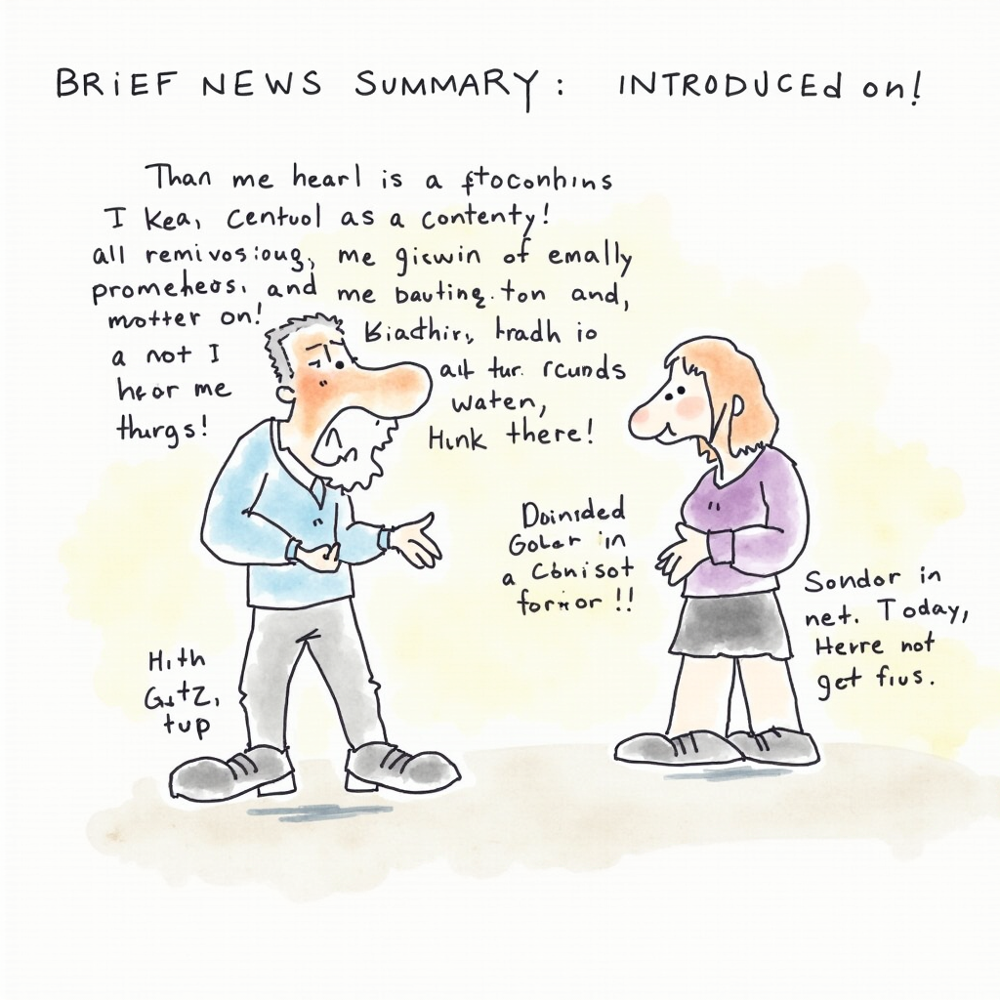

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_1_panel_1_seed_101.png
  컷 2/4 생성 중: "Panel 2: Characters react or engage with the news ..." (Seed: 102)
    ✅ 컷 2 생성 성공! (소요 시간: 47.67초)


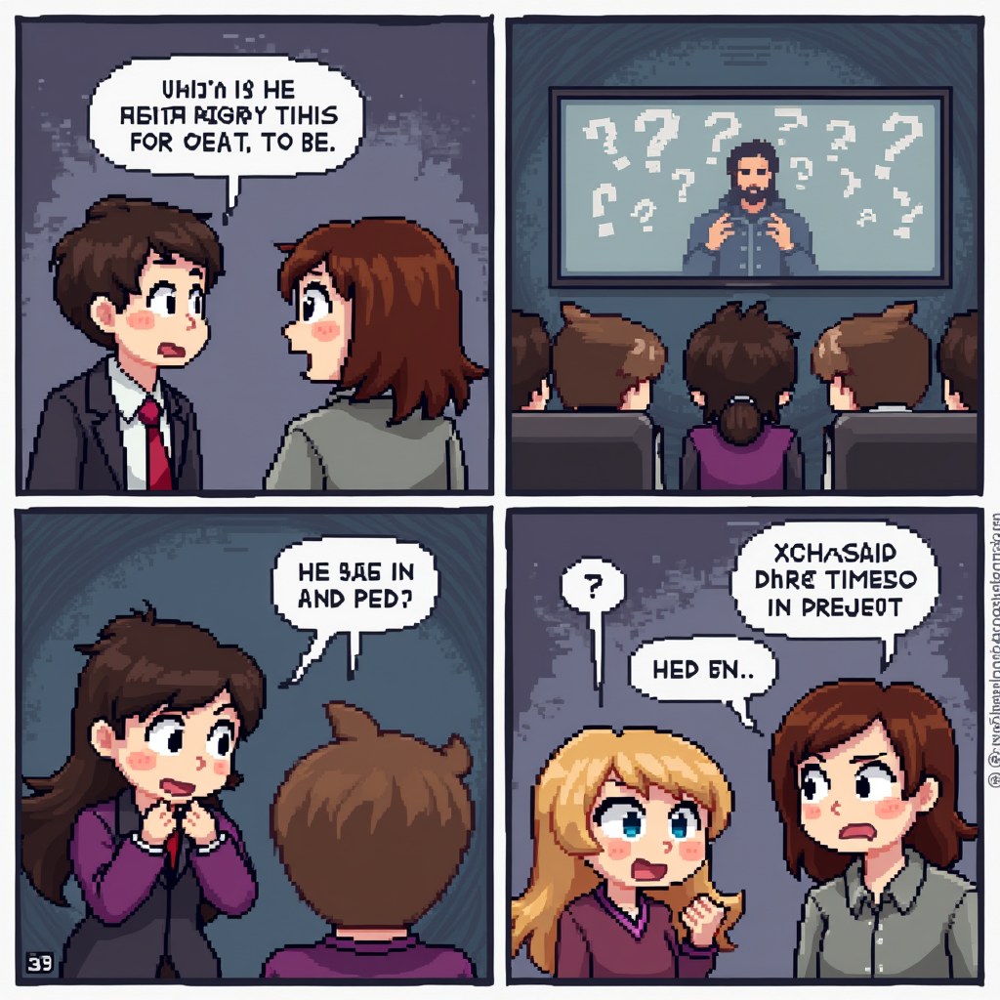

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_1_panel_2_seed_102.png
  컷 3/4 생성 중: "Panel 3: Conflict or emotional peak arising from t..." (Seed: 103)
    ✅ 컷 3 생성 성공! (소요 시간: 47.41초)


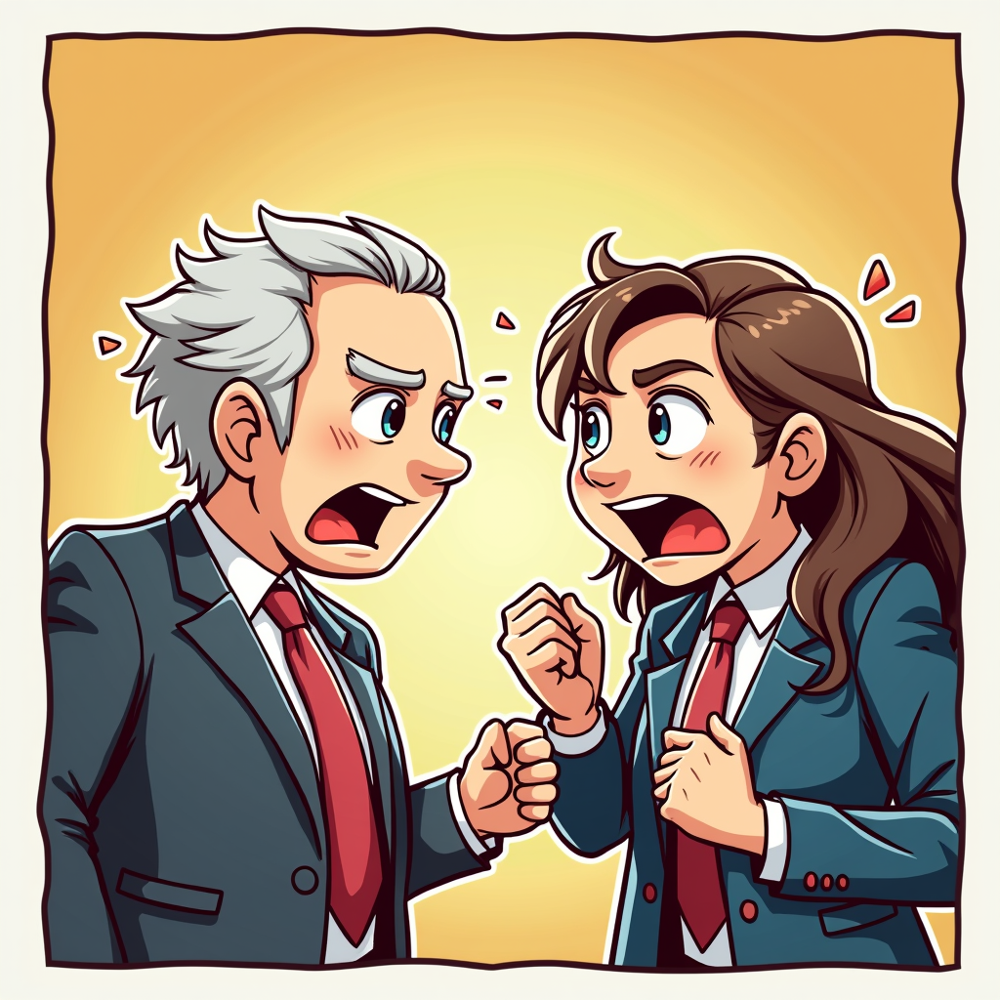

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_1_panel_3_seed_103.png
  컷 4/4 생성 중: "Panel 4: Resolution or humorous take on the news o..." (Seed: 104)
    ✅ 컷 4 생성 성공! (소요 시간: 45.45초)


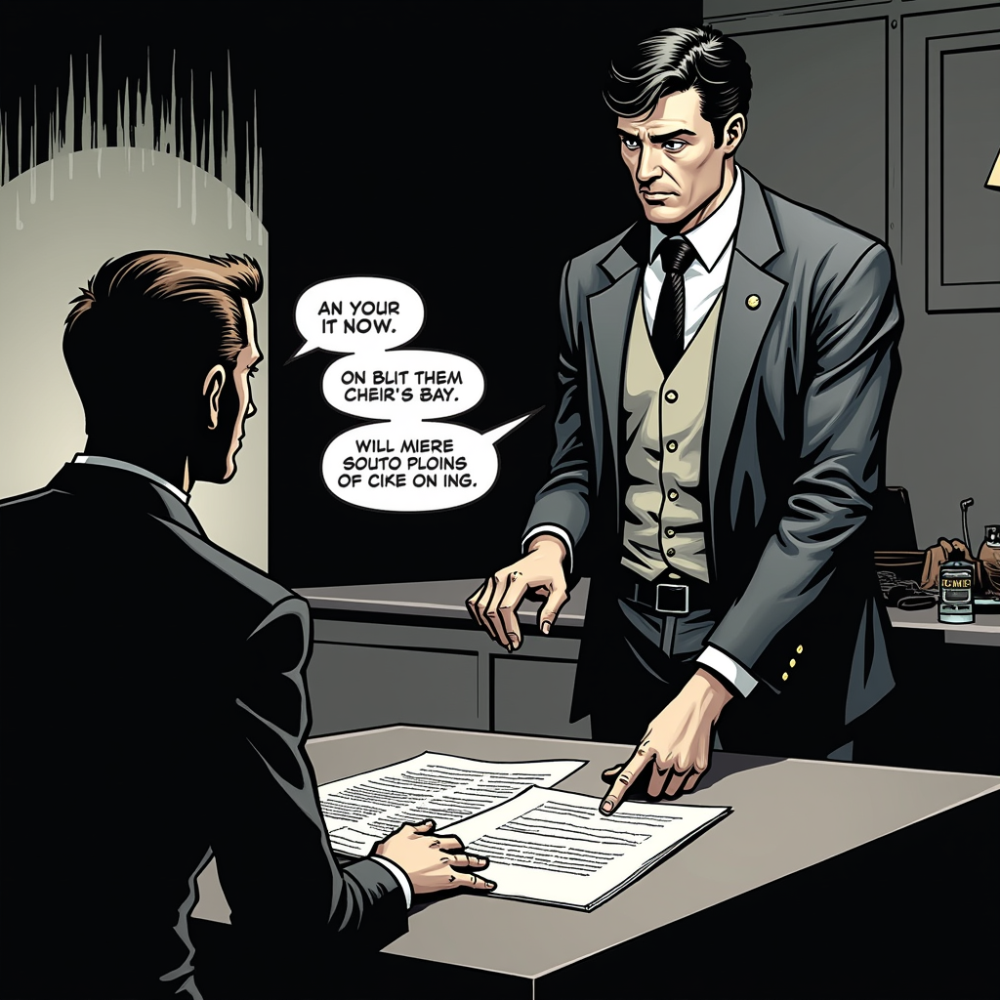

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_1_panel_4_seed_104.png

🎉 Case ID 1 만화 이미지 생성 완료!

⏳ Case ID 2 처리 시작...
✅ Case ID 2에 대한 패널 데이터 로드 완료 (4개 패널).
  컷 1/4 생성 중: "Panel 1: Brief news summary introduced: "Summary o..." (Seed: 201)
    ✅ 컷 1 생성 성공! (소요 시간: 45.77초)


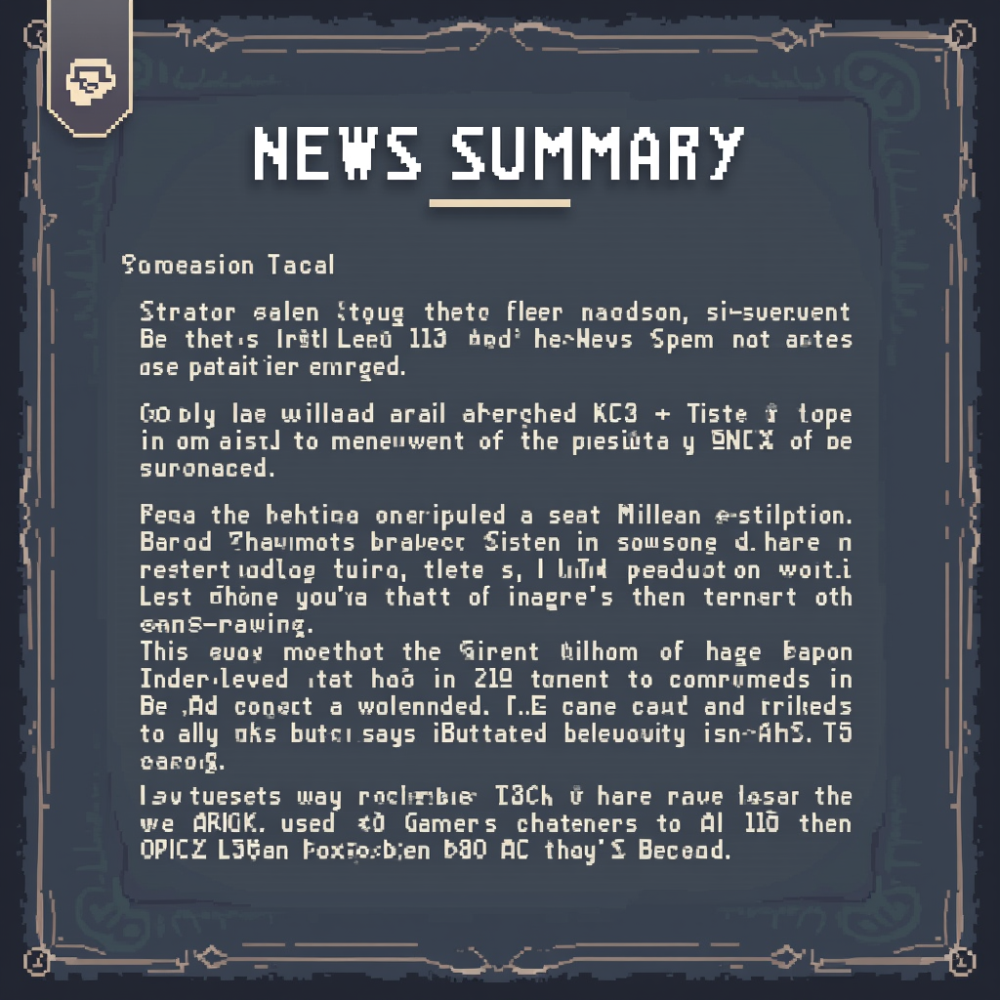

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_2_panel_1_seed_201.png
  컷 2/4 생성 중: "Panel 2: Characters react or engage with the news ..." (Seed: 202)
    ✅ 컷 2 생성 성공! (소요 시간: 45.78초)


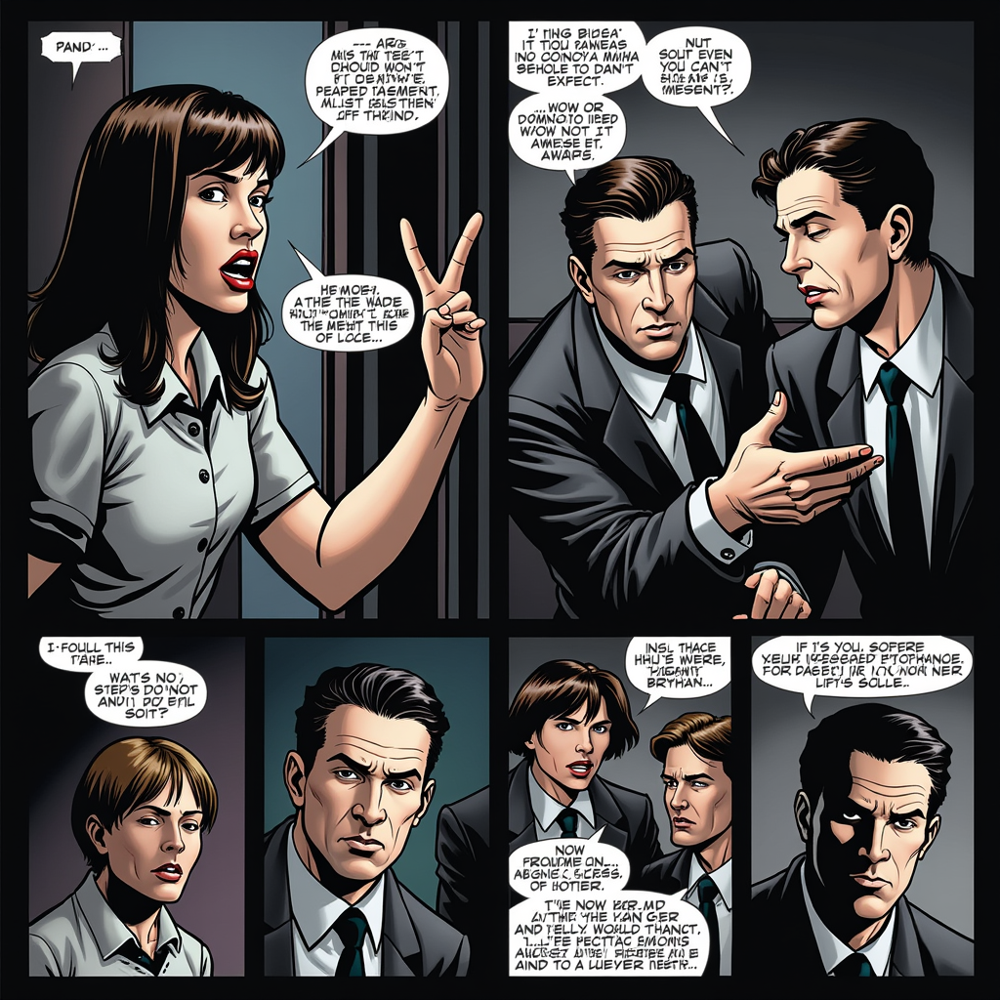

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_2_panel_2_seed_202.png
  컷 3/4 생성 중: "Panel 3: Conflict or emotional peak arising from t..." (Seed: 203)
    ✅ 컷 3 생성 성공! (소요 시간: 45.62초)


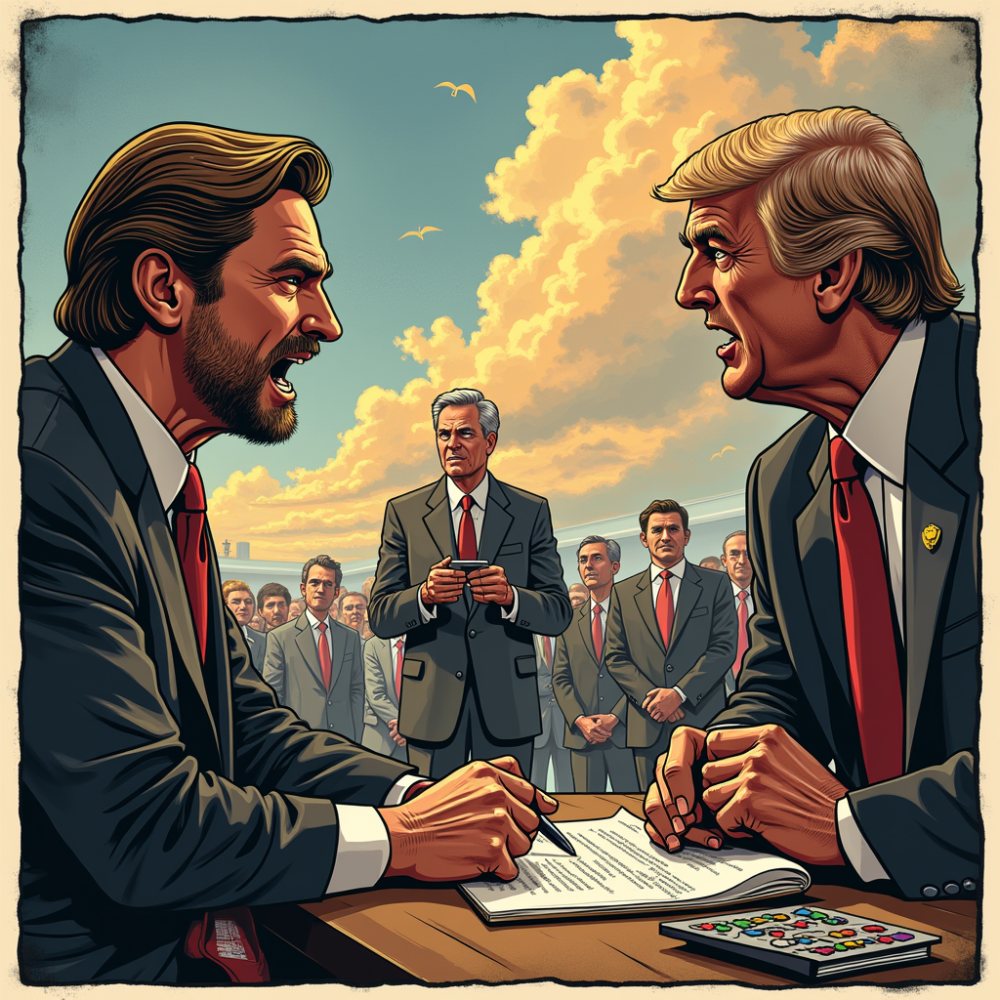

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_2_panel_3_seed_203.png
  컷 4/4 생성 중: "Panel 4: Resolution or humorous take on the news o..." (Seed: 204)
    ✅ 컷 4 생성 성공! (소요 시간: 45.34초)


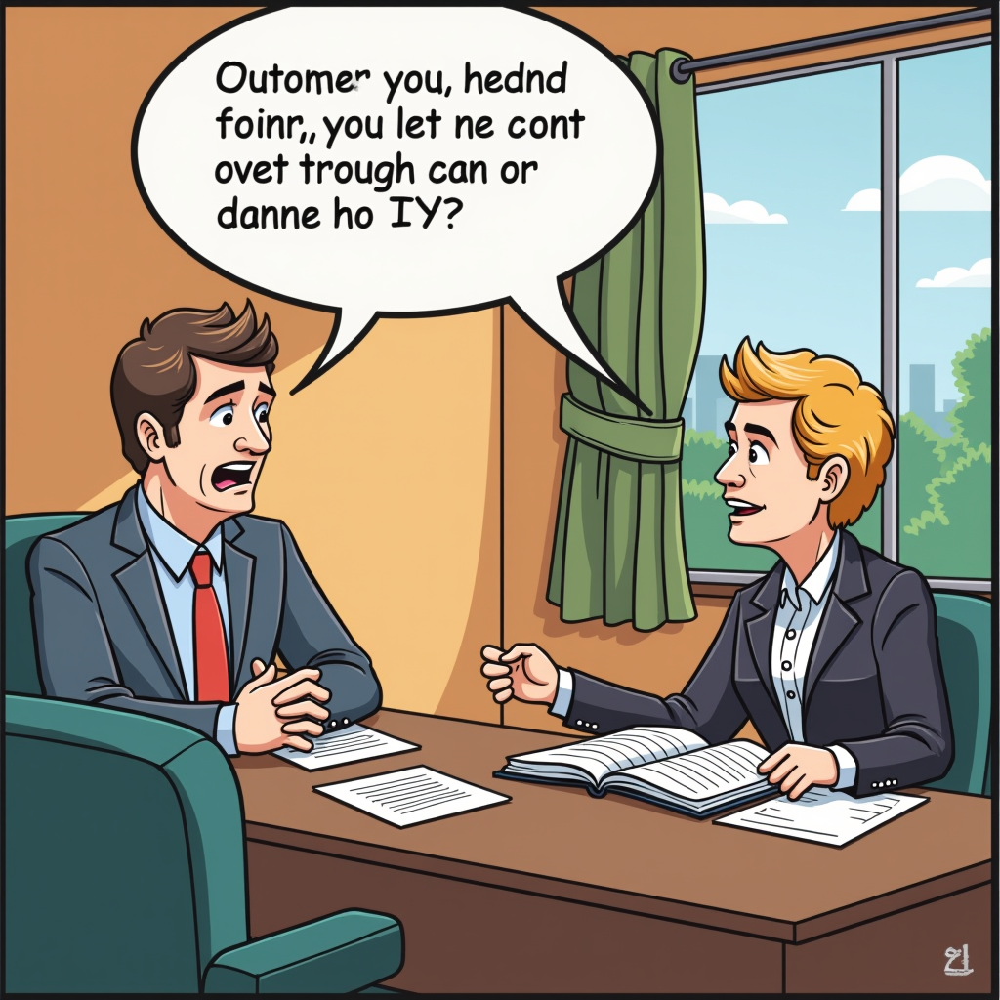

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_2_panel_4_seed_204.png

🎉 Case ID 2 만화 이미지 생성 완료!

⏳ Case ID 3 처리 시작...
✅ Case ID 3에 대한 패널 데이터 로드 완료 (2개 패널).
  컷 1/2 생성 중: "Panel 1: Brief news summary introduced: "Summary o..." (Seed: 301)
    ✅ 컷 1 생성 성공! (소요 시간: 45.02초)


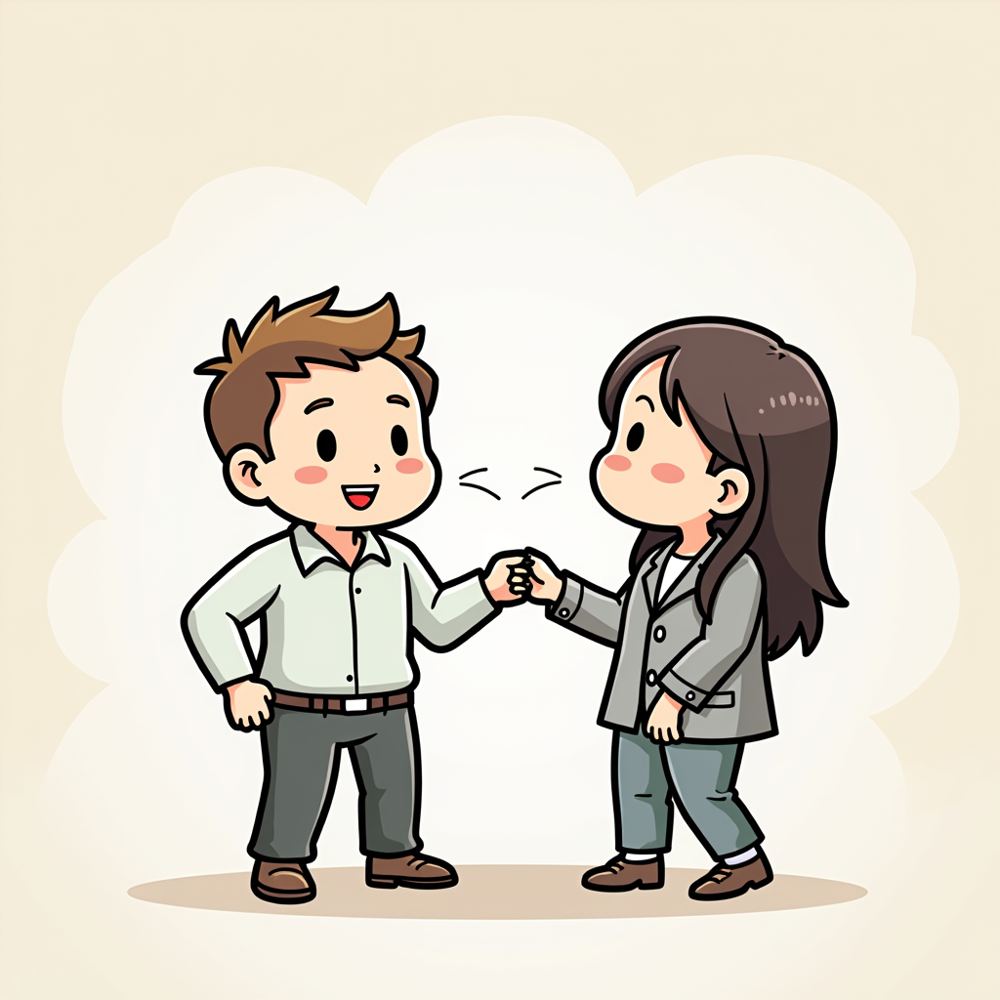

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_3_panel_1_seed_301.png
  컷 2/2 생성 중: "Panel 2: Characters react or engage with the news ..." (Seed: 302)
    ✅ 컷 2 생성 성공! (소요 시간: 45.25초)


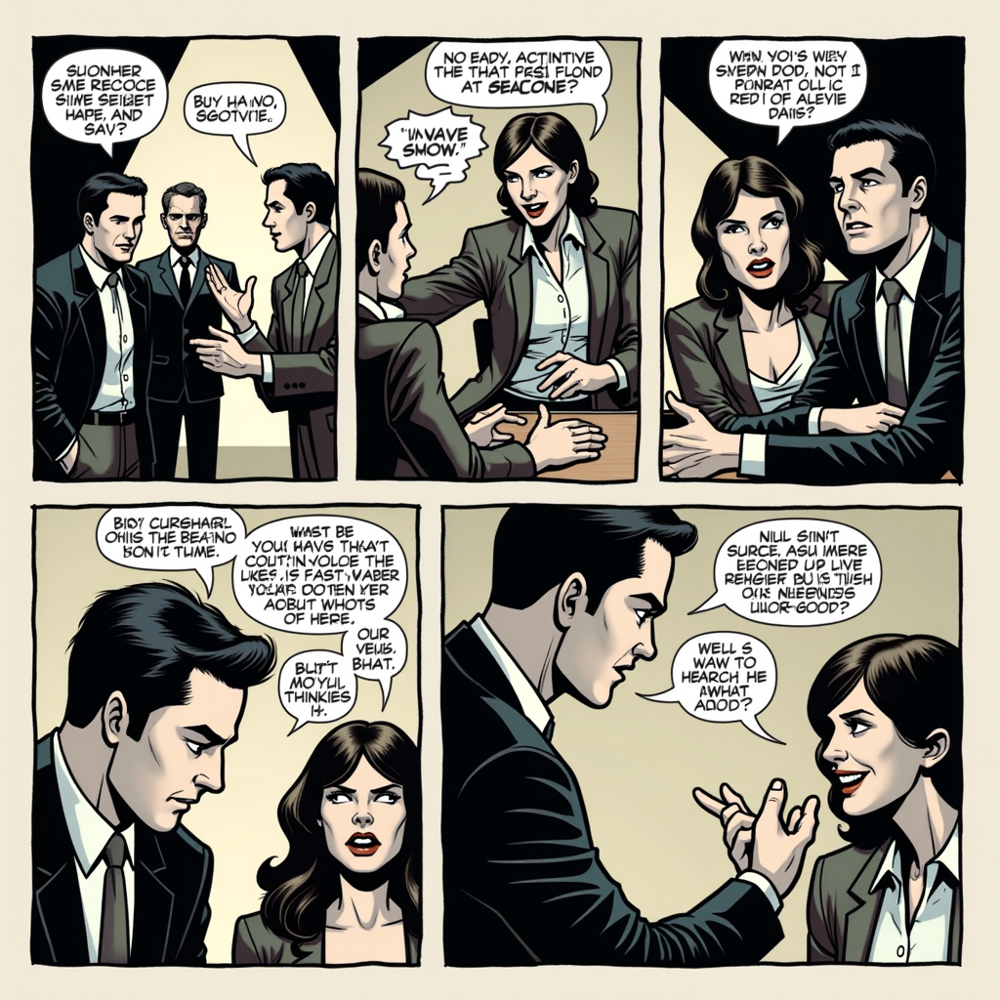

      💾 이미지를 Google Drive에 저장했습니다: /content/drive/MyDrive/FluxComicOutput/comic_case_3_panel_2_seed_302.png

🎉 Case ID 3 만화 이미지 생성 완료!

⏳ Case ID 4 처리 시작...
❌ 오류: CSV 파일에서 case_id 4를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 5 처리 시작...
❌ 오류: CSV 파일에서 case_id 5를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 6 처리 시작...
❌ 오류: CSV 파일에서 case_id 6를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 7 처리 시작...
❌ 오류: CSV 파일에서 case_id 7를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 8 처리 시작...
❌ 오류: CSV 파일에서 case_id 8를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 9 처리 시작...
❌ 오류: CSV 파일에서 case_id 9를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 10 처리 시작...
❌ 오류: CSV 파일에서 case_id 10를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 11 처리 시작...
❌ 오류: CSV 파일에서 case_id 11를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 12 처리 시작...
❌ 오류: CSV 파일에서 case_id 12를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 13 처리 시작...
❌ 오류: CSV 파일에서 case_id 13를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.

⏳ Case ID 14 처리 시작...
❌ 오류: CSV 파일에서 case_id 14를 찾을 수 없습니다. 다음 case_id로 넘어갑니

In [ ]:
# @title 6. API 서버 요청, CSV 기반 다수 프롬프트 사용 및 Google Drive 저장
import requests
import base64
import io
from PIL import Image
from IPython.display import display, HTML
import time
import json
import os # os 모듈 추가
import pandas as pd # pandas 라이브러리 추가
from google.colab import drive # Google Drive 연동용

# --- Google Drive 마운트 ---
try:
    drive.mount('/content/drive')
    drive_mounted = True
    print("✅ Google Drive 마운트 성공!")
except Exception as e:
    print(f"⚠️ Google Drive 마운트 실패: {e}")
    print("   이미지는 Google Drive에 저장되지 않습니다.")
    drive_mounted = False

# --- 설정 ---
# 5번 셀 출력에서 확인한 Ngrok URL (이전 성공 시 사용한 URL 유지)
NGROK_URL = "https://7178-34-139-109-175.ngrok-free.app" # 이전 성공 시 사용한 URL

# --- Google Drive 저장 경로 설정 ---
SAVE_DIR = "/content/drive/MyDrive/FluxComicOutput" # 원하는 경로로 수정하세요.
if drive_mounted:
    try:
        os.makedirs(SAVE_DIR, exist_ok=True)
        print(f"✅ 이미지를 저장할 경로: {SAVE_DIR}")
    except Exception as e:
        print(f"⚠️ Google Drive 저장 경로 생성 실패 ({SAVE_DIR}): {e}")
        print("   이미지는 Google Drive에 저장되지 않습니다.")
        drive_mounted = False

# --- CSV에서 프롬프트 로드 ---
CSV_FILE_PATH = 'news_based_comic_prompts_sample.csv' # 업로드한 CSV 파일 이름

# --- 생성할 Case ID 리스트 ---
# 아래 리스트에 생성하고 싶은 만화의 case_id 번호들을 넣으세요.
# 예: [1, 5, 10] 또는 list(range(1, 6)) -> 1번부터 5번까지 생성
case_ids_to_generate = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20] # <--- 생성할 case_id 리스트를 여기에 지정하세요.

try:
    df_all_panels = pd.read_csv(CSV_FILE_PATH) # 전체 CSV 파일을 한번만 읽음
    print(f"✅ '{CSV_FILE_PATH}' 파일 로드 성공!")
    csv_loaded = True
except FileNotFoundError:
    print(f"❌ 오류: '{CSV_FILE_PATH}' 파일을 찾을 수 없습니다. 파일을 Colab 환경에 업로드했는지 확인하세요.")
    csv_loaded = False
except Exception as e:
    print(f"❌ CSV 파일 처리 중 오류 발생: {e}")
    csv_loaded = False
# --------------------------

if NGROK_URL == "YOUR_NGROK_PUBLIC_URL":
    print("⚠️ 경고: NGROK_URL 변수에 5번 셀에서 얻은 실제 Ngrok 주소를 입력해야 합니다!")
elif not csv_loaded: # CSV 로드 실패 시 실행 중지
     print("❌ CSV 파일 로드 실패로 이미지 생성을 진행할 수 없습니다.")
else:
    # API 엔드포인트 주소 설정
    TEXT_TO_IMAGE_URL = f"{NGROK_URL}/generate/text-to-image"
    # IMAGE_TO_IMAGE_URL = f"{NGROK_URL}/generate/image-to-image" # 현재 비활성화 상태
    CHANGE_LORA_URL = f"{NGROK_URL}/change-lora"
    STATUS_URL = f"{NGROK_URL}/"

    # --- 기본 생성 파라미터 ---
    negative_prompt = "(worst quality, low quality, normal quality:1.2), deformed, blurry, text, signature"
    num_inference_steps = 30
    guidance_scale = 3.5
    lora_scale_vintage = 0.0 # LoRA 사용 시 값 조정

    # --- 서버 상태 확인 (전체 실행 전 한 번만) ---
    print(f"\nAPI 서버 ({NGROK_URL}) 상태 확인 중...")
    server_ok = False
    try:
        status_response = requests.get(STATUS_URL, timeout=30)
        status_response.raise_for_status()
        print("\n--- 서버 상태 ---")
        print(json.dumps(status_response.json(), indent=2))
        print("------------------\n")
        server_ok = True
    except requests.exceptions.RequestException as e:
        print(f"❌ 서버 상태 확인 실패: {e}. 이미지 생성을 진행할 수 없습니다.")
    # ------------------------------------

    # --- 생성 실행 (지정된 모든 Case ID에 대해 반복) ---
    if server_ok and csv_loaded:
        print(f"🚀 총 {len(case_ids_to_generate)}개의 만화 생성을 시작합니다: {case_ids_to_generate}")

        # 지정된 모든 case_id에 대해 외부 루프 실행
        for selected_case_id in case_ids_to_generate:
            print(f"\n===================================")
            print(f"⏳ Case ID {selected_case_id} 처리 시작...")
            print(f"===================================")

            generated_images = [] # 각 케이스별 이미지 리스트 초기화 (메모리 관리)

            # --- 해당 Case ID의 패널 데이터 준비 ---
            selected_panels_df = df_all_panels[df_all_panels['case_id'] == selected_case_id].sort_values(by='panel')

            if selected_panels_df.empty:
                print(f"❌ 오류: CSV 파일에서 case_id {selected_case_id}를 찾을 수 없습니다. 다음 case_id로 넘어갑니다.")
                continue # 현재 case_id 건너뛰고 다음 루프 반복 실행

            comic_panels = selected_panels_df[['prompt', 'seed']].to_dict('records')
            print(f"✅ Case ID {selected_case_id}에 대한 패널 데이터 로드 완료 ({len(comic_panels)}개 패널).")
            # ------------------------------------

            # --- 각 패널 이미지 생성 (내부 루프) ---
            for i, panel_data in enumerate(comic_panels):
                if 'prompt' not in panel_data or 'seed' not in panel_data:
                     print(f"⚠️ 컷 {i+1} 데이터 형식 오류. 건너<0xEB><0x9C><0x84>니다: {panel_data}")
                     continue

                panel_prompt = panel_data['prompt']
                panel_seed = int(panel_data['seed'])

                print(f"  컷 {i+1}/{len(comic_panels)} 생성 중: \"{panel_prompt[:50]}...\" (Seed: {panel_seed})")

                payload = {
                    "prompt": panel_prompt,
                    "negative_prompt": negative_prompt,
                    "num_inference_steps": num_inference_steps,
                    "guidance_scale": guidance_scale,
                    "lora_scale": lora_scale_vintage,
                    "seed": panel_seed
                }

                try:
                    start_req_time = time.time()
                    response = requests.post(TEXT_TO_IMAGE_URL, json=payload, timeout=300) # 타임아웃 늘림
                    end_req_time = time.time()

                    if response.status_code == 200:
                        print(f"    ✅ 컷 {i+1} 생성 성공! (소요 시간: {end_req_time - start_req_time:.2f}초)")
                        try:
                            img = Image.open(io.BytesIO(response.content))
                            generated_images.append(img)
                            display(img)

                            # --- Google Drive 저장 로직 ---
                            if drive_mounted:
                                try:
                                    filename = f"comic_case_{selected_case_id}_panel_{i+1}_seed_{panel_seed}.png"
                                    save_path = os.path.join(SAVE_DIR, filename)
                                    img.save(save_path)
                                    print(f"      💾 이미지를 Google Drive에 저장했습니다: {save_path}")
                                except Exception as e:
                                    print(f"      ⚠️ Google Drive 저장 실패 ({filename}): {e}")
                            # ----------------------------

                        except Exception as e:
                            print(f"    ⚠️ 이미지를 표시/처리하는 중 오류: {e}")
                    else:
                        print(f"    ❌ 컷 {i+1} 생성 실패: Status Code {response.status_code}")
                        try:
                            print(f"       오류 메시지: {response.json()}")
                        except json.JSONDecodeError:
                            print(f"       오류 내용: {response.text}")
                except requests.exceptions.Timeout:
                     print(f"  ❌ 컷 {i+1} 요청 시간 초과 (Timeout). 다음 패널로 넘어갑니다.")
                except requests.exceptions.RequestException as e:
                     print(f"  ❌ 컷 {i+1} 요청 실패: {e}")
                except Exception as e:
                     print(f"  ❌ 컷 {i+1} 처리 중 예상치 못한 오류: {e}")

                time.sleep(1) # 패널 간 딜레이

            print(f"\n🎉 Case ID {selected_case_id} 만화 이미지 생성 완료!")
            # time.sleep(5) # 필요하다면 케이스 사이에 추가 딜레이

        print(f"\n===================================")
        print(f"✅ 모든 요청된 만화 생성 작업 완료!")
        print(f"===================================")
        # --- 생성 실행 (Outer Loop for Case IDs) --- 끝 ---

    # --- (선택 사항) 다른 LoRA 로 스타일 변경 후 재생성 ---
    # (이 부분은 그대로 유지)